# Individual Prediction

## Data Preparation

In [1]:
import pandas as pd
import numpy as np
import joblib
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

Load Previous Trained Model

In [2]:
# Load the saved Random Forest model
model_folder = "../../../2_Modeling_Phase/Saved-Models/"
model_filename = "Farm-Flow_XGBoost.joblib"
model_path = model_folder + model_filename

model = joblib.load(model_path)

Load Train Dataset

In [3]:
df_train = pd.read_csv("../../../0_Datasets/Farm-Flow/train.csv")

Load Test Dataset

In [4]:
df_test = pd.read_csv("../../../0_Datasets/Farm-Flow/test.csv")

In [5]:
display(df_train)

,fwd_pkts_tot,bwd_pkts_tot,fwd_data_pkts_tot,bwd_data_pkts_tot,fwd_pkts_per_sec,bwd_pkts_per_sec,flow_pkts_per_sec,down_up_ratio,fwd_header_size_tot,fwd_header_size_min,...,flow_pkts_payload.max,flow_pkts_payload.tot,flow_pkts_payload.avg,flow_pkts_payload.std,fwd_subflow_pkts,bwd_subflow_pkts,fwd_subflow_bytes,bwd_subflow_bytes,traffic,is_attack
0,-0.236304,-0.662387,-0.577140,-0.443123,-0.277741,-0.268577,-0.273647,-1.394192,-0.643844,-1.423582,...,-0.562720,-0.744570,-0.562649,-0.557806,-0.556874,-0.638986,-0.741186,-0.418623,UDP_Flood,1
1,-0.672105,-0.457813,-0.577140,-0.443123,0.490111,0.504662,0.498222,0.728588,-0.643844,0.278456,...,-0.562720,-0.744570,-0.562649,-0.557806,-0.556874,-0.419418,-0.741186,-0.418623,Port_Scanning,1
2,-0.454205,-0.662387,-0.577140,-0.443123,-0.277918,-0.268577,-0.273736,-1.394192,-0.724235,-1.423582,...,-0.562720,-0.744570,-0.562649,-0.557806,-0.556874,-0.638986,-0.741186,-0.418623,UDP_Flood,1
3,2.378496,2.406229,2.285759,2.444445,-0.276874,-0.267504,-0.272675,0.728588,2.129645,-0.147053,...,-0.240860,1.678331,-0.105550,-0.268638,2.620142,2.654541,1.265201,2.728235,Normal,0
4,-0.672105,-0.457813,-0.577140,-0.443123,-0.277823,-0.268460,-0.273629,0.728588,-0.684039,-0.147053,...,-0.562720,-0.744570,-0.562649,-0.557806,-0.670339,-0.529202,-0.741186,-0.418623,MQTT_Flood,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47341,-0.454205,-0.457813,-0.577140,-0.443123,-0.276776,-0.267991,-0.272869,-0.332802,-0.483062,-0.147053,...,-0.562720,-0.744570,-0.562649,-0.557806,-0.329944,-0.419418,-0.741186,-0.418623,TCP_Flood,1
47342,-0.454205,-0.662387,-0.577140,-0.443123,-0.277509,-0.268577,-0.273530,-1.394192,-0.724235,-1.423582,...,-0.562720,-0.744570,-0.562649,-0.557806,-0.556874,-0.638986,-0.741186,-0.418623,UDP_Flood,1
47343,2.160596,1.997080,2.285759,2.444445,-0.276943,-0.267646,-0.272781,0.576960,1.928668,-0.147053,...,-0.240860,1.678331,-0.054762,-0.267306,0.275202,0.312477,-0.072391,0.630330,Normal,0
47344,1.288996,1.383357,1.713179,0.711904,-0.265775,-0.256330,-0.261520,0.728588,2.330623,1.129475,...,-0.250326,0.400251,-0.238680,-0.346375,1.485493,1.556699,0.470671,0.378581,Normal,0


In [6]:
display(df_test)

,fwd_pkts_tot,bwd_pkts_tot,fwd_data_pkts_tot,bwd_data_pkts_tot,fwd_pkts_per_sec,bwd_pkts_per_sec,flow_pkts_per_sec,down_up_ratio,fwd_header_size_tot,fwd_header_size_min,...,flow_pkts_payload.max,flow_pkts_payload.tot,flow_pkts_payload.avg,flow_pkts_payload.std,fwd_subflow_pkts,bwd_subflow_pkts,fwd_subflow_bytes,bwd_subflow_bytes,traffic,is_attack
0,-0.672105,-0.457813,-0.577140,-0.443123,-0.276940,-0.267571,-0.272742,0.728588,-0.684039,-0.147053,...,-0.562720,-0.744570,-0.562649,-0.557806,-0.556874,-0.419418,-0.741186,-0.418623,MQTT_Flood,1
1,-0.672105,-0.457813,-0.577140,-0.443123,-0.277181,-0.267813,-0.272983,0.728588,-0.684039,-0.147053,...,-0.562720,-0.744570,-0.562649,-0.557806,-0.556874,-0.419418,-0.741186,-0.418623,MQTT_Flood,1
2,-0.454205,-0.457813,-0.577140,-0.443123,-0.276909,-0.268058,-0.272969,-0.332802,-0.483062,-0.147053,...,-0.562720,-0.744570,-0.562649,-0.557806,-0.329944,-0.419418,-0.741186,-0.418623,TCP_Flood,1
3,2.378496,2.406229,2.285759,2.444445,-0.276907,-0.267537,-0.272708,0.728588,2.129645,-0.147053,...,-0.240860,1.678331,-0.105550,-0.268638,2.620142,2.654541,1.265201,2.728235,Normal,0
4,-0.454205,-0.253238,-0.004560,-0.443123,-0.276892,-0.267522,-0.272693,0.728588,-0.241889,1.129475,...,-0.477522,-0.635539,-0.408378,-0.455263,-0.329944,-0.199849,-0.596727,-0.418623,HTTP_Flood,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15778,1.942696,2.201655,2.285759,2.444445,-0.277003,-0.267561,-0.272768,0.891878,1.727690,-0.147053,...,-0.240860,1.678331,-0.054762,-0.267306,0.691239,0.897993,0.262007,1.154806,Arp_Spoofing,1
15779,2.160596,2.201655,2.285759,2.444445,-0.276991,-0.267622,-0.272793,0.728588,1.928668,-0.147053,...,-0.240860,1.678331,-0.072901,-0.267431,2.393212,2.434972,1.265201,2.728235,Normal,0
15780,-0.236304,-0.662387,-0.577140,-0.443123,-0.277906,-0.268577,-0.273730,-1.394192,-0.643844,-1.423582,...,-0.562720,-0.744570,-0.562649,-0.557806,-0.556874,-0.638986,-0.741186,-0.418623,UDP_Flood,1
15781,-0.454205,-0.662387,-0.577140,-0.443123,-0.277687,-0.268577,-0.273620,-1.394192,-0.724235,-1.423582,...,-0.562720,-0.744570,-0.562649,-0.557806,-0.556874,-0.638986,-0.741186,-0.418623,UDP_Flood,1


-----
## Train and Test Datasets

Drop Multiclass Column

In [7]:
df_train = df_train.drop('traffic', axis=1)
df_test = df_test.drop('traffic', axis=1)

Excluding the target variable

In [8]:
X_columns = df_train.columns.drop('is_attack')

Create a feature matrix X by selecting only the columns specified in X_columns. Then convert the selected data into a NumPy array.

In [9]:
X = df_train[X_columns].values

Creates a target variable y containing the target variable

In [10]:
y = df_train["is_attack"].values

Split into training and testing sets

In [11]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42, stratify=y)

Get Features Names and Class Names

In [12]:
feature_names = list(X_columns)
class_names = ["Normal", "Malicious"]
response_dict = {0: 'Normal', 1: 'Malicious'}

Generate Prediction

In [13]:
pred = model.predict(X_test)

Labeled Df's

In [14]:
X_test_labeled = pd.DataFrame(X_test, columns=feature_names)
X_train_labeled = pd.DataFrame(X_train, columns=feature_names)

# Since both are one-dimensional NumPy arrays
pred_series = pd.Series(pred)
y_test_target_series = pd.Series(y_test)
y_train_target_series = pd.Series(y_train)

Create a subset of the Train DF for faster training

In [15]:
subset_percentage = 0.1
X_subset, _, y_subset, _ = train_test_split(X_train, y_train, test_size=1 - subset_percentage, stratify=y_train)

In [16]:
subset_percentage = 0.1
X_subset_labeled, _, y_subset_labeled, _ = train_test_split(X_train_labeled, y_train_target_series, test_size=1 - subset_percentage, stratify=y_train_target_series)

Row to explain

In [17]:
idx = 0

---

## Anchor

In [18]:
from anchor import utils
from anchor import anchor_tabular

explainer = anchor_tabular.AnchorTabularExplainer(
    class_names,
    feature_names,
    X_train)

np.random.seed(1)
exp = explainer.explain_instance(X_test[idx], model.predict, threshold=0.95)

exp.show_in_notebook()

## Dalex

In [19]:
import dalex as dx

exp = dx.Explainer(model, X_train_labeled, y_train_target_series)

Preparation of a new explainer is initiated

  -> data              : 35509 rows 33 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 35509 values
  -> model_class       : xgboost.sklearn.XGBClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x73f961283100> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.00209, mean = 0.696, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.976, mean = 3.76e-06, max = 0.968
  -> model_info        : package xgboost

A new explainer has been created!


/home/ivoafonsobispo/miniconda3/lib/python3.12/site-packages/dalex/predict_explanations/_break_down/utils.py:124: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  average_yhats_norm[i] = average_yhats[i] - diffs_1d[inds.iloc[i, 0]] - diffs_1d.iloc[inds.iloc[i, 1]]
/home/ivoafonsobispo/miniconda3/lib/python3.12/site-packages/dalex/predict_explanations/_break_down/utils.py:124: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  average_yhats_norm[i] = average_yhats[i] - diffs_1d[inds.iloc[i, 0]] - diffs_1d.iloc[inds.iloc[i, 1]]
/home/ivoafonsobispo/miniconda3/lib/python3.12/site-packages/dalex/predict_explanations/_break_down/

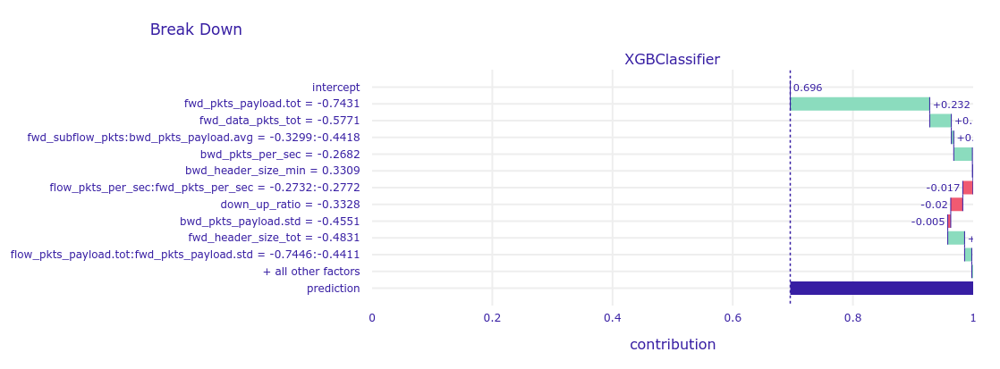

In [20]:
exp.predict_parts(X_test_labeled.iloc[idx]).plot(min_max=[0,1])

## LIME

In [21]:
import lime
from interpret.blackbox import LimeTabular
from lime.lime_tabular import LimeTabularExplainer

explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=feature_names, class_names=class_names, discretize_continuous=True)

exp = explainer.explain_instance(X_test[idx], model.predict_proba, num_features=33, top_labels=1)
exp.show_in_notebook(show_table=True, show_all=False)

## SHAP

In [22]:
import shap
shap.initjs()

explainer = shap.TreeExplainer(model)

shap_values = explainer.shap_values(X_test)

/home/ivoafonsobispo/miniconda3/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html



Predicted: 1


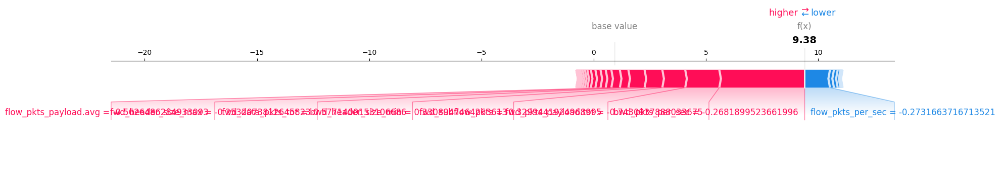

In [23]:
prediction = model.predict(X_test)

print(f"Predicted: {prediction[idx]}")

shap.force_plot(explainer.expected_value,
                shap_values[idx],
                X_test[idx],
                feature_names=feature_names,
                matplotlib=True)

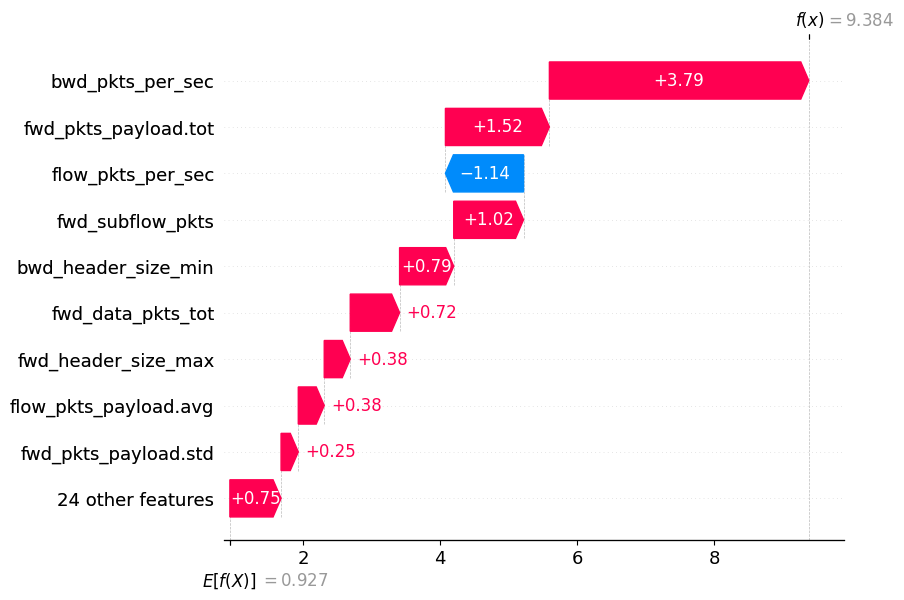

In [24]:
base_value = explainer.expected_value

# Change shap_values[0] or shap_values[1], if you want explaination for 'Normal' or 'Malicious'
explanation = shap.Explanation(values=shap_values[0], base_values=base_value,feature_names=feature_names)

shap.plots.waterfall(explanation)

## InterpretML

In [25]:
from interpret import set_visualize_provider
from interpret.provider import InlineProvider
set_visualize_provider(InlineProvider())

from interpret import show
from interpret.blackbox import ShapKernel

In [26]:
shap = ShapKernel(model, X_test_labeled, feature_names=feature_names)
#shap = ShapKernel(model, X_subset_labeled, feature_names=feature_names)

shap_local = shap.explain_local(X_test_labeled[idx:idx+1], y_test_target_series[idx:idx+1])
show(shap_local, 0)

Using 11837 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [01:00<00:00, 60.28s/it]


In [27]:
from interpret.blackbox import LimeTabular

lime = LimeTabular(model, X_test_labeled,feature_names=feature_names)

show(lime.explain_local(X_test_labeled[idx:idx+1], y_test_target_series[idx:idx+1]), 0)

## Shapash

## Explainer Dashboard

In [28]:
import re

def clean_feature_name(feature_name):
    cleaned_name = re.sub(r'[^a-zA-Z0-9_]', '_', feature_name)
    return cleaned_name

cleaned_feature_names = [clean_feature_name(feature) for feature in X_test_labeled.columns]

X_test_labeled.columns = cleaned_feature_names
y_test_target_series.columns = cleaned_feature_names

from explainerdashboard import ClassifierExplainer, ExplainerDashboard
explainer = ClassifierExplainer(model, X_test_labeled, y_test_target_series)

ExplainerDashboard(explainer).run()

Detected XGBClassifier model: Changing class type to XGBClassifierExplainer...
Note: model_output=='probability'. For XGBClassifier shap values normally get calculated against X_background, but paramater X_background=None, so using X instead
Generating self.shap_explainer = shap.TreeExplainer(model, X, model_output='probability', feature_perturbation='interventional')...
Note: Shap interaction values will not be available. If shap values in probability space are not necessary you can pass model_output='logodds' to get shap values in logodds without the need for a background dataset and also working shap interaction values...
Building ExplainerDashboard..
Detected notebook environment, consider setting mode='external', mode='inline' or mode='jupyterlab' to keep the notebook interactive while the dashboard is running...
For this type of model and model_output interactions don't work, so setting shap_interaction=False...
Generating layout...
Calculating shap values...


 99%|===================| 11705/11837 [01:19<00:00]        

Calculating prediction probabilities...
Calculating metrics...
Calculating confusion matrices...
Calculating classification_dfs...
Calculating roc auc curves...
Calculating pr auc curves...
Calculating liftcurve_dfs...
Generating xgboost model dump...
Calculating dependencies...
Calculating permutation importances (if slow, try setting n_jobs parameter)...
Calculating pred_percentiles...
Calculating predictions...
Calculating ShadowDecTree for each individual decision tree...
Reminder: you can store the explainer (including calculated dependencies) with explainer.dump('explainer.joblib') and reload with e.g. ClassifierExplainer.from_file('explainer.joblib')
Registering callbacks...
Starting ExplainerDashboard on http://10.20.228.103:8050


Address already in use
Port 8050 is in use by another program. Either identify and stop that program, or start the server with a different port.


AttributeError: 'tuple' object has no attribute 'tb_frame'

----------
## Notes:
- Archor, Dalex, LIME, and InterpretML, all gave me the same result that the model for that instance predicted that the instance was malicious because: "fwd_pkts_payload.tot <= -0.74"
- SHAP and SHAPASH I got different results saying that "bwd_pkts_per_sec" was the most important feature for the prediction.

1. **Local Interpretability Techniques (LIME, Archor, Dalex, InterpretML):**
- These techniques focus on creating local substitute models or perturbing the input data to understand the impact of each feature on the model prediction for a specific instance.
- They might use techniques like linear models or decision trees to approximate the complex behavior of the underlying model for a given data point.
- The results obtained from these methods heavily depend on the substitute model used and the perturbations applied.

2. **SHAP (SHapley Additive exPlanations):**
- Provide a unique way to distribute the contribution of each feature to the model prediction across all possible feature combinations.
- SHAP values provide a global measure of feature importance, and the values are consistent, meaning the sum of SHAP values for all features equals the difference between the model's output for the given instance and the expected output.

The reason for the discrepancy in feature importance results could be:

- **Local vs. Global Interpretability:**
    - Local interpretability methods might focus more on the specific characteristics of the instance under investigation, while SHAP provides a more global perspective on feature importance.
    - It's possible that the specific instance has a unique combination of feature values, making local methods provide different results.

- **Other Model Variability:**
    - Local interpretability methods rely on creating other models, and the choice of the other model can impact the results. Different libraries may use different models or techniques, leading to variability in feature importance.

- **Feature Interactions:**
    - SHAP values inherently consider interactions between features, providing a more holistic view of how each feature contributes. Local interpretability methods may or may not capture such interactions accurately.
    
    
Q: SHAP takes longer to train than Local Interpretability Techniques, does that mean the SHAP result is more correct then the Local Interpretability Techniques?
The duration of the interpretability technique's computation does not necessarily correlate with the correctness or accuracy of the results. The time taken for computation is more related to the complexity of the algorithm and the underlying computations involved.

- **Accuracy vs. Speed Trade-off:**
    - SHAP values aim to provide accurate and theoretically grounded feature importance values, but the computation can be time-consuming.
    - Local interpretability techniques might sacrifice some accuracy for speed, especially when dealing with individual instance explanations.
- **Global vs. Local Interpretability:**
    - SHAP provides a global view of feature importance that applies consistently across instances.
    - Local interpretability techniques focus on explaining individual predictions and might not capture the global behavior of the model.
- **Complexity of the Model:**
    - For simpler models or models with fewer features, the computational cost of SHAP might be more manageable.
    
In terms of cybersecurity, it might depend, on the type of traffic we are having. If we want to mitigate zero-day attacks Local Interpretability should be the best choice since we can get a fast response to that problem, meanwhile if the attack was more disruptive SHAP could give a better answer of how the traffic was affected.

**Local Interpretability (e.g., LIME):**
- **Advantages:**
    - Provides quick insights into the behavior of the model for a specific instance, making it useful for rapid response.
    - Particularly valuable for identifying and understanding the reasons behind individual predictions, which can aid in detecting and mitigating zero-day attacks.
    - Can be computationally less expensive, making it suitable for real-time or near-real-time applications.
- **Considerations:**
    - Focuses on local explanations for individual predictions, which may not capture the global behavior of the model.
    - The interpretability might be limited to the specific instance under investigation.

**Global Interpretability (e.g., SHAP):**
- **Advantages:**
    - Provides a comprehensive, global view of feature importance, aiding in understanding the overall behavior of the model.
    - Helps in identifying features that consistently contribute to predictions across various instances, potentially revealing broader patterns or insights.
    - Useful for understanding the impact of features on model predictions in a more general sense.
- **Considerations:**
    - Computationally more expensive, especially for complex models and datasets with many features.
    - Might not provide quick insights into specific instances, making it potentially less suitable for real-time response.

**Choosing the Right Approach:**
- **Zero-Day Attacks:**
    - For rapidly responding to potential zero-day attacks, local interpretability methods can be beneficial. They offer quick insights into why a specific instance is classified in a certain way.
- **Disruptive Attacks:**
    - For more disruptive or widespread attacks, global interpretability methods like SHAP can help in understanding the broader impact on model predictions and identifying consistently influential features.
- **Hybrid Approaches:**
    - Depending on specific needs, a hybrid approach that combines both local and global interpretability techniques. This can provide a well-rounded understanding of your model's behavior, both at the instance level and in a broader context.